In [1]:
!pip install diffusers transformers accelerate scipy safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.5 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.

In [4]:
from diffusers import StableDiffusionPipeline, EulerDiscreteScheduler
from statistics import mean, stdev
import matplotlib.pyplot as plt
import math,time, torch
from transformers import CLIPModel, CLIPTokenizer, CLIPImageProcessor
import html, base64
from io import BytesIO
from IPython.display import HTML, display

In [5]:
print("Torch:", torch.__version__, "| CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Torch: 2.6.0+cu124 | CUDA available: True
GPU: Tesla T4


In [6]:
PROMPTS = [
    "a futuristic cyberpunk city at night, rain, neon reflections, cinematic",
    "a watercolor painting of a fox in a misty forest, soft light, high detail",
    "an astronaut riding a horse on the moon, 35mm photo, sharp focus",
    "a bowl of ramen with steam, food photography, studio lighting",
    "a cozy cabin in the snow, golden hour, volumetric lighting",
    "a photorealistic portrait of an elderly woman, rim lighting, 85mm",
    "isometric pixel art of a small village with a river, vibrant",
    "a surreal desert with floating rocks, long shadows, high contrast",
    "a product shot of sneakers on a reflective surface, studio lighting",
    "a stormy ocean with a lighthouse, long exposure, dramatic sky",
    "a medieval castle on a cliff at sunrise, low fog, cinematic",
    "a macro photograph of a dewdrop on a leaf, extreme detail, bokeh",
    "a neon-lit alley after rain, puddle reflections, 35mm street photo",
    "a golden retriever puppy sitting in wildflowers, shallow depth of field",
    "a futuristic sports car in a tunnel, motion blur, studio-grade lighting",
    "a Scandinavian living room interior, natural light, minimal, cozy",
    "alpine mountains with a turquoise lake at sunrise, ultra wide-angle",
    "a fantasy dragon flying over a city, dramatic backlighting, epic scale",
    "an aerial view of rice terraces at sunset, drone photography",
    "a Tokyo night market street food cart, cinematic composition",
    "an astronaut walking through a glowing bioluminescent forest, mist",
    "abstract geometric shapes in pastel colors, 3D render, soft shadows",
    "an underwater coral reef with tropical fish, sun rays from surface",
    "an ancient temple overgrown with jungle vines, morning mist, moody"
]

NEG = "low quality, blurry, low-res, artifacts, watermark, oversaturated, underexposed"

SEEDS = [123, 456, 789, 42, 777, 2025, 101, 202, 303, 404, 505, 606, 707, 808, 909, 1111, 1212, 1313, 1414, 1515, 1616, 1717, 1818, 1919]
USE_GPU = torch.cuda.is_available()
WIDTH, HEIGHT = 512, 512
STEPS = 30
GUIDANCE = 6.5
BATCH_SIZE = 2    
REPS_PER_PROMPT = 5 if USE_GPU else 1
MODEL_ID = "sd-legacy/stable-diffusion-v1-5"

In [7]:
device = "cuda" if USE_GPU else "cpu"
dtype = torch.float16 if device == "cuda" else torch.float32

scheduler = EulerDiscreteScheduler.from_pretrained(MODEL_ID, subfolder="scheduler")
pipe = StableDiffusionPipeline.from_pretrained(MODEL_ID, scheduler=scheduler, torch_dtype=torch.float16)
pipe = pipe.to(device)

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
clip_id = "openai/clip-vit-base-patch32"   
clip_model = CLIPModel.from_pretrained(clip_id).to(device)
clip_tok   = CLIPTokenizer.from_pretrained(clip_id)
clip_imgp  = CLIPImageProcessor.from_pretrained(clip_id)

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

In [9]:
@torch.inference_mode()
def batched_clip_scores(texts, pil_images):
    toks = clip_tok(texts, padding=True, return_tensors="pt").to(device)
    pix  = clip_imgp(images=pil_images, return_tensors="pt").pixel_values.to(device)
    img_f = clip_model.get_image_features(pixel_values=pix)
    txt_f = clip_model.get_text_features(**toks)
    img_f = img_f / img_f.norm(dim=-1, keepdim=True)
    txt_f = txt_f / txt_f.norm(dim=-1, keepdim=True)
    sims = (img_f * txt_f).sum(dim=-1)                 
    return ((sims + 1.0) * 50.0)

In [10]:
# --- Warmup (stabilize timings on GPU) ---
_ = pipe("warmup", num_inference_steps=10, width=384, height=384)

  0%|          | 0/10 [00:00<?, ?it/s]

In [11]:
images = []            
clip_scores = []       
lat_secs_all = []      
vram_peak_gb = [] 
num_prompts = len(PROMPTS)
num_batches = math.ceil(num_prompts / BATCH_SIZE)

for b in range(num_batches):
    s = b * BATCH_SIZE
    e = min(num_prompts, s + BATCH_SIZE)
    batch_prompts = PROMPTS[s:e]
    batch_seeds   = SEEDS[s:e]
    batch_size_actual = len(batch_prompts)

    # One generator per IMAGE (prompt variation): length = batch_size_actual * REPS_PER_PROMPT
    generators = [
        torch.Generator(device=device).manual_seed(seed + k)
        for seed in batch_seeds
        for k in range(REPS_PER_PROMPT)
    ]

    # timing
    if device == "cuda":
        torch.cuda.reset_peak_memory_stats()
        torch.cuda.synchronize()
        evt_start = torch.cuda.Event(enable_timing=True)
        evt_end   = torch.cuda.Event(enable_timing=True)
        evt_start.record()
        ctx = torch.autocast(device_type="cuda", dtype=torch.float16)
    else:
        t0 = time.time()
        ctx = torch.no_grad()

    with torch.inference_mode(), ctx:
        out = pipe(
            prompt=batch_prompts,
            negative_prompt= [NEG]*2,
            num_inference_steps=STEPS,
            guidance_scale=GUIDANCE,
            width=WIDTH, height=HEIGHT,
            num_images_per_prompt=REPS_PER_PROMPT,
            generator=generators,
        )

    # end timing + peak VRAM
    if device == "cuda":
        evt_end.record()
        torch.cuda.synchronize()
        batch_ms = evt_start.elapsed_time(evt_end)  # ms
        batch_secs = batch_ms / 1000.0
        peak_gb = torch.cuda.max_memory_allocated() / (1024**3)
    else:
        batch_secs = time.time() - t0
        peak_gb = 0.0

    vram_peak_gb.append(peak_gb)

    # per-image latency approximation from batch time
    batch_images = out.images  # length = batch_size_actual * REPS_PER_PROMPT
    per_image_secs = batch_secs / len(batch_images)
    lat_secs_all.extend([per_image_secs] * len(batch_images))

    # best-of-K per prompt (use your existing clip_score(prompt, image))
    for j, prompt in enumerate(batch_prompts):
        start_idx = j * REPS_PER_PROMPT
        end_idx   = start_idx + REPS_PER_PROMPT
        imgs_k = batch_images[start_idx:end_idx]

        best_img = None
        best_scr = -1e9
        for im in imgs_k:
            scr = batched_clip_scores(prompt, im)
            if scr > best_scr:
                best_scr = scr
                best_img = im

        images.append(best_img)
        clip_scores.append(best_scr)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Prompt,Image
"1. a futuristic cyberpunk city at night, rain, neon reflections, cinematic",
"2. a watercolor painting of a fox in a misty forest, soft light, high detail",
"3. an astronaut riding a horse on the moon, 35mm photo, sharp focus",
"4. a bowl of ramen with steam, food photography, studio lighting",
"5. a cozy cabin in the snow, golden hour, volumetric lighting",
"6. a photorealistic portrait of an elderly woman, rim lighting, 85mm",
"7. isometric pixel art of a small village with a river, vibrant",
"8. a surreal desert with floating rocks, long shadows, high contrast",
"9. a product shot of sneakers on a reflective surface, studio lighting",
"10. a stormy ocean with a lighthouse, long exposure, dramatic sky",

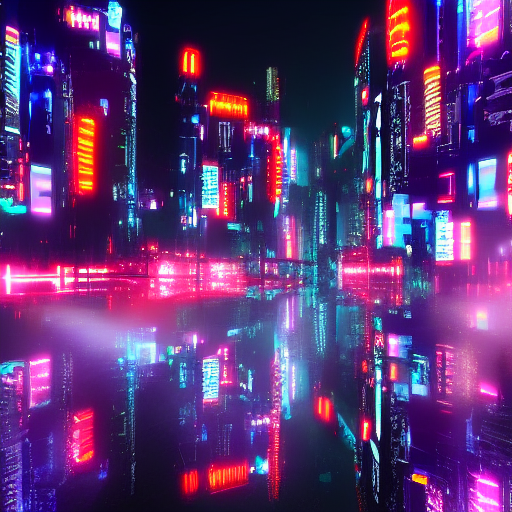
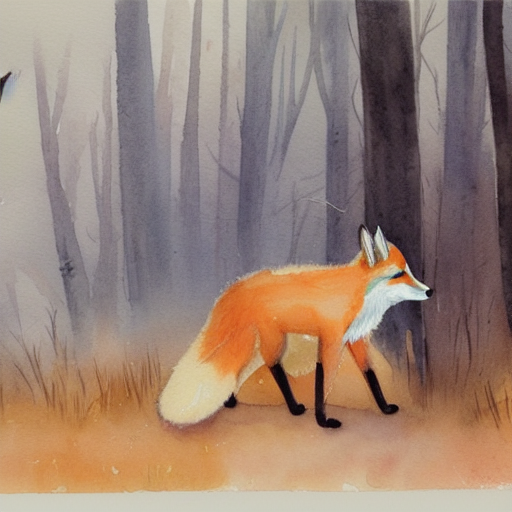
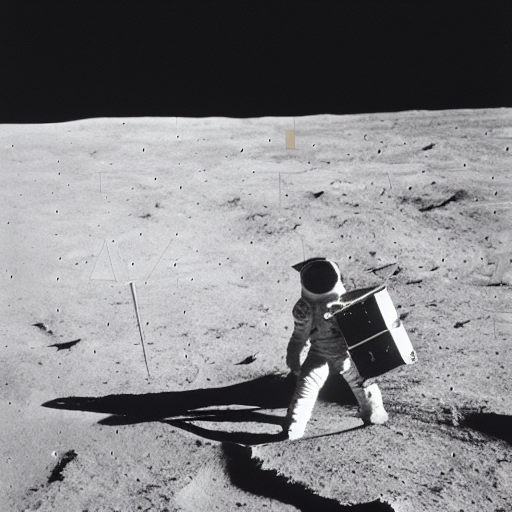
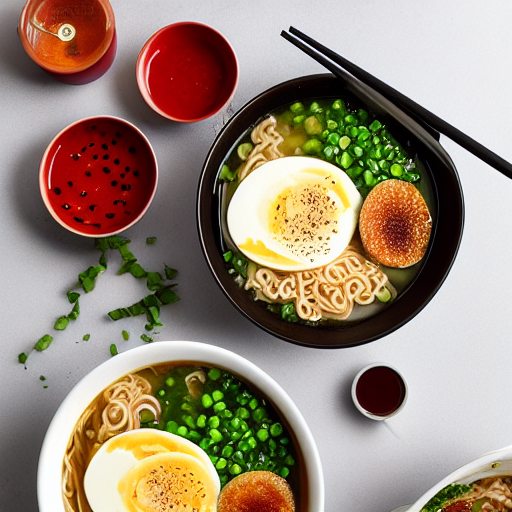
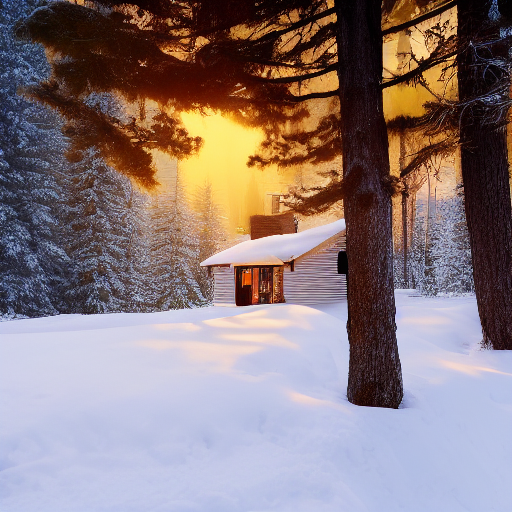
...
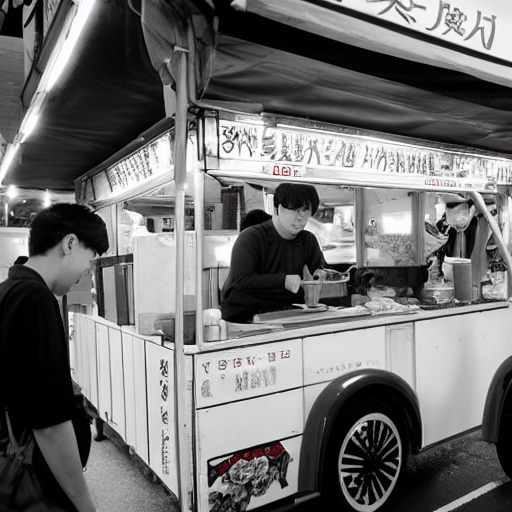
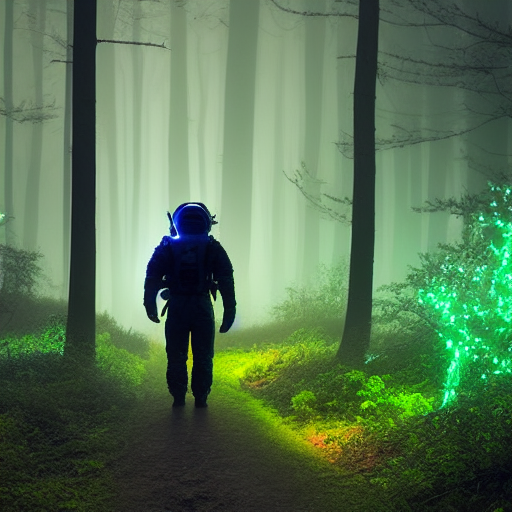
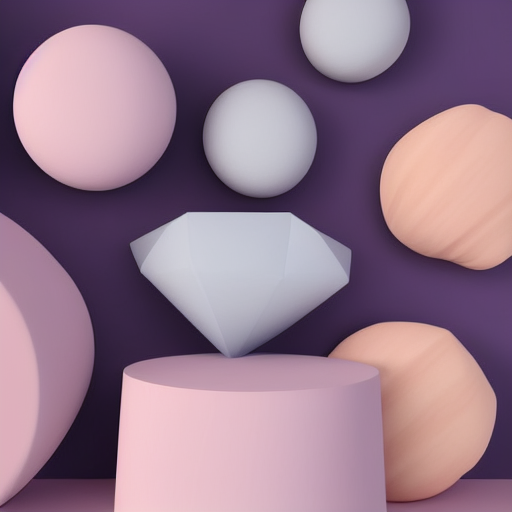
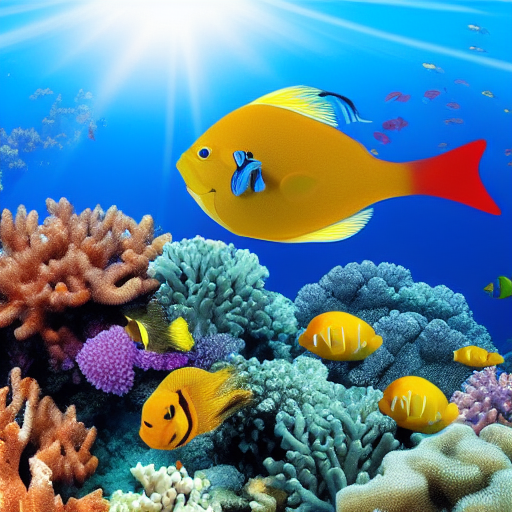
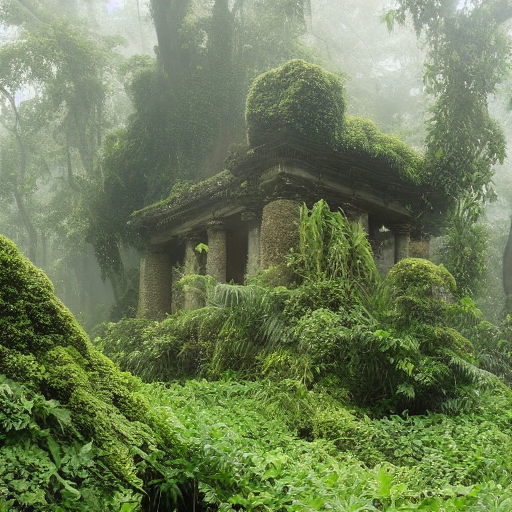

In [12]:
# Smaller images (about 3× smaller). Adjust THUMBNAIL_PX if needed.


THUMBNAIL_PX = 210  # ~640/3 ≈ 213; tweak as you like (e.g., 180–240)

def img_to_data_uri(pil_img):
    buf = BytesIO()
    pil_img.save(buf, format="PNG")
    return "data:image/png;base64," + base64.b64encode(buf.getvalue()).decode("utf-8")

N = min(len(PROMPTS), len(images))
rows_html = []
for i in range(N):
    prompt = f"{i+1}. {PROMPTS[i]}"
    img_uri = img_to_data_uri(images[i])
    rows_html.append(f"""
      <tr>
        <td class="prompt-col">{html.escape(prompt)}</td>
        <td class="img-col"><img src="{img_uri}" alt="image {i+1}"></td>
      </tr>
    """)

table_html = f"""
<style>
  table.prompt-img {{
    border-collapse: collapse;
    width: 100%;
    table-layout: fixed;
    font-family: system-ui, -apple-system, Segoe UI, Roboto, sans-serif;
  }}
  table.prompt-img th, table.prompt-img td {{
    border: 1px solid #ddd;
    padding: 10px;
    vertical-align: top;
  }}
  table.prompt-img thead th {{
    background: #f7f7f7;
    text-align: left;
    font-size: 16px;
  }}
  .prompt-col {{
    width: 60%;
    font-size: 16px;
    line-height: 1.4;
    word-break: break-word;
    white-space: pre-wrap;
  }}
  .img-col {{
    width: 40%;
  }}
  .img-col img {{
    width: {THUMBNAIL_PX}px;   /* fixed small thumbnails */
    height: auto;
    border: 1px solid #ccc;
    border-radius: 6px;
    display: block;
  }}
</style>

<table class="prompt-img">
  <colgroup>
    <col style="width:60%">
    <col style="width:40%">
  </colgroup>
  <thead>
    <tr><th>Prompt</th><th>Image</th></tr>
  </thead>
  <tbody>
    {''.join(rows_html)}
  </tbody>
</table>
"""

display(HTML(table_html))


In [13]:
# Convert lists of tensors to lists of floats
lat_secs_all_float = [x.item() if hasattr(x, 'item') else float(x) for x in lat_secs_all]
clip_scores_float = [x.item() if hasattr(x, 'item') else float(x) for x in clip_scores]
vram_peak_gb_float = [x.item() if hasattr(x, 'item') else float(x) for x in vram_peak_gb]

avg_lat_s = mean(lat_secs_all_float) if lat_secs_all_float else float('nan')
std_lat_s = stdev(lat_secs_all_float) if len(lat_secs_all_float) > 1 else 0.0
avg_clip  = mean(clip_scores_float) if clip_scores_float else float('nan')
std_clip  = stdev(clip_scores_float) if len(clip_scores_float) > 1 else 0.0
avg_vram  = mean(vram_peak_gb_float) if vram_peak_gb_float else 0.0
max_vram  = max(vram_peak_gb_float) if vram_peak_gb_float else 0.0

print("===== Batched best-of-K (micro-batched) =====")
print(f"Prompts: {num_prompts} | K per prompt: {REPS_PER_PROMPT} | Batch size: {BATCH_SIZE}")
print(f"Latency per image (secs): mean={avg_lat_s:.3f}  std={std_lat_s:.3f}  | imgs/min={ (60/avg_lat_s) if avg_lat_s>0 else float('nan') :.2f}")
print(f"Best-of-K CLIPScore per prompt: mean={avg_clip:.2f}  std={std_clip:.2f}")
if device == "cuda":
    print(f"GPU peak per micro-batch (GB): mean={avg_vram:.2f}  max={max_vram:.2f}")
else:
    print("CPU run: VRAM metrics unavailable.")

===== Batched best-of-K (micro-batched) =====
Prompts: 24 | K per prompt: 5 | Batch size: 2
Latency per image (secs): mean=5.239  std=0.266  | imgs/min=11.45
Best-of-K CLIPScore per prompt: mean=67.45  std=1.18
GPU peak per micro-batch (GB): mean=11.59  max=11.59


In [15]:
# Save a table image of the LAST 7 prompt–image pairs
# Inputs:
#   PROMPTS : list[str]
#   images  : list[PIL.Image.Image]  (same length/order as PROMPTS)
#
# Output:
#   creates "last7_table.png" (or your chosen outfile) with a 2-column table:
#     | Prompt (wrapped) | Thumbnail |
#
# You can then add it to your README:
#   ![Prompts & Images](last7_table.png)

from PIL import Image, ImageDraw, ImageFont
import os

def save_last7_table_image(PROMPTS, images, THUMBNAIL_PX=210, outfile="last7_table.png"):
    assert len(PROMPTS) and len(images), "PROMPTS/images must be non-empty"
    N = min(len(PROMPTS), len(images))
    k = min(7, N)
    start = N - k

    # ---- basic layout settings ----
    PADDING_OUTER = 18          # outer padding around the table
    CELL_PAD      = 12          # inner padding inside each cell
    BORDER        = 1
    HEADER_BG     = (247, 247, 247)
    BORDER_COLOR  = (221, 221, 221)
    TEXT_COLOR    = (24, 26, 27)    # near-black
    BG_COLOR      = (255, 255, 255)

    # Table widths (approx 60/40 split). Ensure right col fits the thumbnail.
    LEFT_W  = 700
    RIGHT_W = max(int(LEFT_W * 2/3), THUMBNAIL_PX + 2*CELL_PAD)  # keep right wide enough
    TOTAL_W = LEFT_W + RIGHT_W + 2*PADDING_OUTER + 2*BORDER

    # Load a readable font (fallback to default if no TTF available)
    def _load_font(size):
        try:
            # Common macOS / Linux system fonts; adjust if you prefer a specific one
            return ImageFont.truetype("Arial.ttf", size)
        except Exception:
            try:
                return ImageFont.truetype("DejaVuSans.ttf", size)
            except Exception:
                return ImageFont.load_default()

    font_body   = _load_font(16)
    font_header = _load_font(16)

    # Text wrapping helper using draw.textlength for accurate width
    def wrap_text(text, font, max_width, draw):
        words = (text or "").split()
        if not words:
            return [""]
        lines, line = [], words[0]
        for w in words[1:]:
            test = line + " " + w
            if draw.textlength(test, font=font) <= max_width:
                line = test
            else:
                lines.append(line)
                line = w
        lines.append(line)
        return lines

    # Prepare rows (last 7)
    rows = []
    for i in range(start, N):
        prompt = f"{i+1}. {PROMPTS[i]}"
        img    = images[i].convert("RGB")

        # scale thumbnail to THUMBNAIL_PX width
        if img.width != THUMBNAIL_PX:
            scale = THUMBNAIL_PX / float(img.width)
            thumb_h = max(1, int(img.height * scale))
            img = img.resize((THUMBNAIL_PX, thumb_h), Image.LANCZOS)

        rows.append((prompt, img))

    # Create a dummy draw to measure text
    dummy = Image.new("RGB", (10, 10), BG_COLOR)
    ddraw = ImageDraw.Draw(dummy)

    # Header height
    header_text_h = int(font_header.getbbox("Ag")[3] - font_header.getbbox("Ag")[1])
    header_h = header_text_h + 2*CELL_PAD

    # Compute row heights based on wrapped text and thumbnail height
    row_heights = []
    wrapped_prompts = []
    for prompt, thumb in rows:
        max_text_w = LEFT_W - 2*CELL_PAD
        lines = wrap_text(prompt, font_body, max_text_w, ddraw)
        wrapped_prompts.append(lines)
        line_h = int(font_body.getbbox("Ag")[3] - font_body.getbbox("Ag")[1])
        text_h = len(lines) * (line_h + 2)  # small line spacing
        content_h = max(text_h, thumb.height)
        row_heights.append(content_h + 2*CELL_PAD)

    # Compute total height
    total_rows_h = sum(row_heights)
    TOTAL_H = (
        2*PADDING_OUTER
        + BORDER                       # top border
        + header_h
        + BORDER
        + total_rows_h
        + BORDER                       # bottom border
    )

    # Create the canvas
    canvas = Image.new("RGB", (TOTAL_W, TOTAL_H), BG_COLOR)
    draw   = ImageDraw.Draw(canvas)

    # Table origin (top-left of outer border area)
    x0 = PADDING_OUTER
    y0 = PADDING_OUTER

    # Draw outer border rectangle
    draw.rectangle([x0, y0, x0 + LEFT_W + RIGHT_W + 2*BORDER, y0 + header_h + total_rows_h + 2*BORDER],
                   outline=BORDER_COLOR, width=BORDER)

    # Header area
    header_top    = y0 + BORDER
    header_bottom = header_top + header_h
    # Horizontal line between header and rows
    draw.line([(x0, header_bottom), (x0 + LEFT_W + RIGHT_W + 2*BORDER, header_bottom)],
              fill=BORDER_COLOR, width=BORDER)

    # Header background
    draw.rectangle([x0 + BORDER, header_top, x0 + BORDER + LEFT_W + RIGHT_W, header_bottom],
                   fill=HEADER_BG)

    # Column separators (vertical line between left/right)
    sep_x = x0 + BORDER + LEFT_W
    draw.line([(sep_x, header_top), (sep_x, header_bottom + total_rows_h)], fill=BORDER_COLOR, width=BORDER)

    # Header labels
    draw.text((x0 + BORDER + CELL_PAD, header_top + CELL_PAD), "Prompt", fill=TEXT_COLOR, font=font_header)
    draw.text((sep_x + CELL_PAD,       header_top + CELL_PAD), "Image",  fill=TEXT_COLOR, font=font_header)

    # Draw rows
    cur_y = header_bottom + BORDER
    for (lines, (prompt, thumb), row_h) in zip(wrapped_prompts, rows, row_heights):
        # Horizontal grid line at the bottom of this row
        draw.line([(x0, cur_y + row_h), (x0 + LEFT_W + RIGHT_W + 2*BORDER, cur_y + row_h)],
                  fill=BORDER_COLOR, width=BORDER)

        # Prompt cell text
        text_x = x0 + BORDER + CELL_PAD
        text_y = cur_y + CELL_PAD
        for ln in lines:
            draw.text((text_x, text_y), ln, fill=TEXT_COLOR, font=font_body)
            text_y += int(font_body.getbbox("Ag")[3] - font_body.getbbox("Ag")[1]) + 2

        # Image cell (right column)
        img_x = sep_x + CELL_PAD
        # center the thumbnail vertically within the row
        img_y = cur_y + (row_h - thumb.height) // 2
        canvas.paste(thumb, (img_x, img_y))

        cur_y += row_h

    # Save
    canvas.save(outfile, "PNG")
    print(f"Saved table image → {os.path.abspath(outfile)}")


# ---- Call it (example) ----
# Assumes you already have PROMPTS (list[str]) and images (list[PIL.Image.Image])
# save_last7_table_image(PROMPTS, images, THUMBNAIL_PX=210, outfile="last7_table.png")


In [16]:
save_last7_table_image(PROMPTS, images)

Saved table image → /kaggle/working/last7_table.png


In [ ]:
i